# Practical Five: Optical Flow

This notebook is prepared to introduce you to the basics of estimating and visualising optical flow field (motion) in bi-temporal images. We will use the celebrated Lucas-Kanade method to estimate the optical flow field.

### References
* [Based on "Homework 3: Optical Flow"](https://github.com/pjreddie/vision-hw3)
* [Lecture 8: Optical Flow](https://docs.google.com/presentation/d/11f77YuX5YVUmhr1QWYGCSmg5lHyml0VaRjDh93aceHI/edit?usp=sharing)
* [Lucas–Kanade method](https://en.wikipedia.org/wiki/Lucas%E2%80%93Kanade_method)

## Load Required Modules

In [95]:
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
import numpy as np
import matplotlib.pyplot as pl

In [96]:
def np2img(im, norm=False, rgb_mode=False):
    """
    This function converts the input numpy object im to Image object and returns
    the converted object. If norm == True, then the input is normalised to [0,1]
    using im <- (im - im.min()) / (im.max() - im.min()).
    """
    if norm:
        if ((im.max() - im.min()) != 0.0):
            im = (im - im.min()) / (im.max() - im.min())

    if ((im.min() >= 0.0) and (im.max() <= 1.0)):
        im = im * 255.0

    if rgb_mode and im.ndim == 2:
        im = im[...,np.newaxis].repeat(3, axis=2)
        
    if im.ndim == 2:
        im = Image.fromarray(im.astype(np.uint8), mode='L')
    elif (im.ndim == 3) and (im.shape[2] == 3):
        im = Image.fromarray(im.astype(np.uint8), mode='RGB')

    return im


def imresize_nn(im, width, height, img_obj=False):
    """
    This function resizes the input Image object im to the size of (width x height)
    pixels based on the nearest neigbor interpolation and returns the resized Image object.
    """
    # Convert the input Image object to numpy array object
    im = np.array(im).astype(float)
    if (im.shape[0] == height) and (im.shape[1] == width):
        im_res = im.copy()
    else:
        # Create an empty array of (height x width) pixels
        if im.ndim == 2:
            im_res = np.zeros((height, width))
        else:
            im_res = np.zeros((height, width, im.shape[2]))

        # Match up coordinates using (x_res, y_res) -> (x_im, y_im), i.e.,
        # a_x * x_res + b_x = x_im
        # a_y * y_res + b_y = y_im
        a_x = ((im.shape[1] - 0.5) - (-0.5)) / ((im_res.shape[1] - 0.5) - (-0.5))
        b_x = (-0.5) - a_x * (-0.5)
        a_y = ((im.shape[0] - 0.5) - (-0.5)) / ((im_res.shape[0] - 0.5) - (-0.5))
        b_y = (-0.5) - a_y * (-0.5)

        # Create a lookup table for speeding up the operations
        y_im = np.zeros(im_res.shape[0], dtype=np.int32)
        for i in range(im_res.shape[0]):
            y_im[i] = int(np.round(a_y * i + b_y))
            if y_im[i] < 0:
                y_im[i] = 0
            if y_im[i] > (im.shape[0] - 1):
                y_im[i] = im.shape[0] - 1

        x_im = np.zeros(im_res.shape[1], dtype=np.int32)
        for i in range(im_res.shape[1]):
            x_im[i] = int(np.round(a_x * i + b_x))
            if x_im[i] < 0:
                x_im[i] = 0
            if x_im[i] > (im.shape[1] - 1):
                x_im[i] = im.shape[1] - 1
        # Iterate over new points
        for y in range(im_res.shape[0]):
            for x in range(im_res.shape[1]):
                im_res[y, x] = im[y_im[y], x_im[x]]

    if img_obj:
        im_res = np2img(im_res)

    return im_res


def imresize_bi(im, width, height, img_obj=False):
    """
    This function resizes the input Image object im to the size of (width x height) 
    pixels based on the bilinear interpolation and returns the resized Image object.
    """
    # Convert the input Image object to numpy array object

    im = np.array(im).astype(float)
    if (im.shape[0] == height) and (im.shape[1] == width):
        im_res = im.copy()
    else:
        # Create an empty array of (height x width) pixels
        if im.ndim == 2:
            im_res = np.zeros((height, width))
        else:
            im_res = np.zeros((height, width, im.shape[2]))

        # Match up coordinates using (x_res, y_res) -> (x_im, y_im), i.e.,
        # a_x * x_res + b_x = x_im
        # a_y * y_res + b_y = y_im
        a_x = ((im.shape[1]-0.5) - (-0.5)) / ((im_res.shape[1]-0.5) - (-0.5))
        b_x = (-0.5) - a_x * (-0.5)
        
        a_y = ((im.shape[0]-0.5) - (-0.5)) / ((im_res.shape[0]-0.5) - (-0.5))
        b_y = (-0.5) - a_y * (-0.5)
        
        # Create a lookup table for speeding up the operations
        y_im = np.zeros((im_res.shape[0], 2), dtype=np.int32)
        y_im_d = np.zeros((im_res.shape[0], 2), dtype=np.float32)
        for i in range(im_res.shape[0]):
            y_im_ = a_y * i + b_y
            # Take care of the boundary cases
            if y_im_ < 0.0:
                y_im_ = np.abs(y_im_)
            if y_im_ > (im.shape[0]-1):
                y_im_ = (im.shape[0]-1) - (y_im_-(im.shape[0]-1))
            # Compute the mapping in the input image coordinate
            y_im[i,0] = int(np.floor(y_im_))
            y_im[i,1] = int(np.ceil(y_im_))
            y_im_d[i,0] = y_im[i,1] - y_im_
            y_im_d[i,1] = y_im_ - y_im[i,0]
            

        x_im = np.zeros((im_res.shape[1], 2), dtype=np.int32)
        x_im_d = np.zeros((im_res.shape[1], 2), dtype=np.float32)
        for i in range(im_res.shape[1]):
            x_im_ = a_x * i + b_x
            # Take care of the boundary cases
            if x_im_ < 0.0:
                x_im_ = np.abs(x_im_)
            if x_im_ > (im.shape[1]-1):
                x_im_ = (im.shape[1]-1) - (x_im_-(im.shape[1]-1))
            # Compute the mapping in the input image coordinate
            x_im[i,0] = int(np.floor(x_im_))
            x_im[i,1] = int(np.ceil(x_im_))
            x_im_d[i,0] = x_im[i,1] - x_im_
            x_im_d[i,1] = x_im_ - x_im[i,0]
        
        # Iterate over new points
        for y in range(im_res.shape[0]):
            for x in range(im_res.shape[1]):
                if (x_im[x,0] == x_im[x,1]) and (y_im[y,0] == y_im[y,1]):
                    q = im[y_im[y,0], x_im[x,0]]
                elif (x_im[x,0] == x_im[x,1]):
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v3 = im[y_im[y,1], x_im[x,1]]
                    q = v1 * y_im_d[y,0] + v3 * y_im_d[y,1]
                elif (y_im[y,0] == y_im[y,1]):
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v2 = im[y_im[y,1], x_im[x,1]]
                    q = v1 * x_im_d[x,0] + v2 * x_im_d[x,1]
                else:
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v2 = im[y_im[y,0], x_im[x,1]]
                    v3 = im[y_im[y,1], x_im[x,0]]
                    v4 = im[y_im[y,1], x_im[x,1]]
                    q1 = v1 * x_im_d[x,0] + v2 * x_im_d[x,1]
                    q2 = v3 * x_im_d[x,0] + v4 * x_im_d[x,1]
                    q = q1 * y_im_d[y,0] + q2 * y_im_d[y,1]
    
                im_res[y, x] = q

    if img_obj:
        im_res = np2img(im_res)
    
    return im_res


def imfilter(im, filter, preserve=False, img_obj=False, mode='edge'):
    """
    This function filters the input object im with the numpy array filter and 
    returns the filtered image object.
    """
    # Convert the input object to numpy array object
    im = np.array(im).astype(float)
    if (im.ndim == 2):
        im = im[...,np.newaxis]
    # Get the filter dimensions
    h, w = filter.shape[:2][0] // 2, filter.shape[:2][1] // 2
    if (filter.ndim == 2):
        filter = filter[...,np.newaxis]
    # Apply padding on the input image to handle image boundaries
    pad_width = [[h,h],[w,w]]
    for d in range(2, im.ndim):
        pad_width.append([0,0])
    im = np.pad(im, pad_width=pad_width, mode=mode)
    # Create place holder for the filtered image
    if preserve:
        im_ = im.copy()
        # Iterate over pixels
        for y in range(h, im.shape[0]-h):
            for x in range(w, im.shape[1]-w):
                im_[y,x] = (im[y-h:y+h+1, x-w:x+w+1] * filter).sum(axis=(0,1))
    else:
        im_ = np.zeros(im.shape[:2])
        # Iterate over pixels
        for y in range(h, im.shape[0]-h):
            for x in range(w, im.shape[1]-w):
                im_[y,x] = (im[y-h:y+h+1, x-w:x+w+1] * filter).sum()

    # Exclude the boundary pixels
    im = im_[h:im.shape[0]-h, w:im.shape[1]-w]

    if img_obj:
        im = np2img(im)
    
    return im


def box_filter(width, height, channel=1):
    """
    This function creates and returns a numpy array of size (height x width) with all entries equal to 1/(height x width x channel). 
    If any of input parameters width and height is an even number, then it is rolled up to the nearest
    odd number. Note that if channel > 1, then the returned array will be of dimensions (height x width x channel).
    """
    if (width % 2) == 0:
        width += 1
    if (height % 2) == 0:
        height += 1

    if channel > 1:
        data = np.ones((height, width, channel)) / (height * width * channel)
    else:
        data = np.ones((height, width)) / (height * width)

    return data


def gaussian_kernel(sigma, dim=1):
    """
    This function generates and returns either a 1D (dim=1) or 2D (dim=2)
    Gaussian kernel with a standard deviation sigma. Note that the function
    automatically adjusts the kernel size so that 99% of the distribution falls 
    within 3 standard deviations.
    """
    k = int(2 * np.ceil(3*sigma) + 1)
    x = np.linspace(-3*sigma, 3*sigma, k)
    g = 1.0 / np.sqrt(2 * np.pi * sigma**2) * np.exp(-x**2/(2*sigma**2))
    g = g / g.sum()
    g = g[np.newaxis,...]
    if dim == 2:
        g = np.dot(g.T, g)
        
    return g

## Lucas-Kanade Optical Flow Estimation

We will be implementing [Lucas–Kanade method](https://en.wikipedia.org/wiki/Lucas%E2%80%93Kanade_method) to estimate the optical flow (velocity) vector $(u_{i},v_{i})$ for the pixel $\mathbf{p}_{i} = (x_{i}, y_{i})$ using the following equation

$
\left[\begin{matrix} u_{i} \\ v_{i} \end{matrix}\right]=\left[\begin{matrix} \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \\ \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \end{matrix}\right]^{-1} \left[\begin{matrix} -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \\ -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \end{matrix}\right],
$

where $u_{i}$ and $v_{i}$ are respectively estimated horizontal and vertical velocity at the pixel $\mathbf{p}_{i}$, $\mathcal{N}_{i}$ represents the set of all pixels within the neighborhood of the pixel $\mathbf{p}_{i}$. $I_{x}(\mathbf{p}_{i})$, $I_{y}(\mathbf{p}_{i})$, $I_{t}(\mathbf{p}_{i})$ are the partial derivatives of the image $I$ with respect to position $x$, $y$ and time $t$, evaluated at the pixel $\mathbf{p}_{i}$ and at the current time. $\mathcal{N}_{i}$ is usually based on a $w \times w$ window around the pixel $\mathbf{p}_{i}$. 



### Estimating Spatial and Temporal Derivatives

In order to compute the optical flow (velocity) vector $(u_{i},v_{i})$ for the pixel $\mathbf{p}_{i}$, we first need to compute the partial derivatives $I_{x}(\mathbf{p}_{i})$, $I_{y}(\mathbf{p}_{i})$, $I_{t}(\mathbf{p}_{i})$ at the pixel $\mathbf{p}_{i}$. We already know how to compute spatial derivatives $I_{x}$ and $I_{y}$ from the previous practicals. The partial derivative of the image $I$ with respect to time $t$ (or temporal derivative of the image) can be computed as follows

$I_{t} = I^{(t)} - I^{(t-1)}$,

where $I^{(t)}$ is the current image at time $t$ (i.e., $I^{(t)} = I$) and $I^{(t-1)}$ is the previous image at time $(t-1)$. Please note that we slightly abuse the mathematical notation here by introducing the superscript $(t)$ to represent the images captured in time.

In the following, we load and display two consecuitive images `I1` and `I2`, where `I2` is the most recent image, i.e., $I^{(t)}$=`I2` and $I^{(t-1)}$=`I1`.

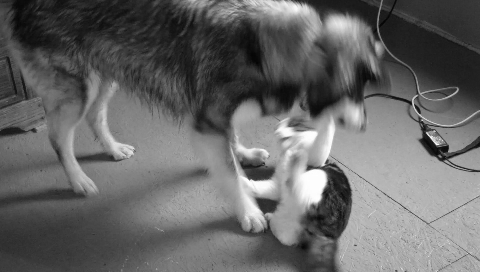

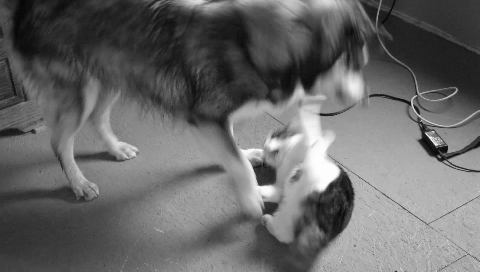

In [97]:
I1_RGB = Image.open('../data/dog_time1.jpg').convert('RGB')
I2_RGB = Image.open('../data/dog_time2.jpg').convert('RGB')
I3_RGB = Image.open('../data/dog_time3.jpg').convert('RGB')
I1_RGB = imresize_nn(I1_RGB, I1_RGB.width//4, I1_RGB.height//4, True)
I2_RGB = imresize_nn(I2_RGB, I2_RGB.width//4, I2_RGB.height//4, True)
I3_RGB = imresize_nn(I3_RGB, I3_RGB.width//4, I3_RGB.height//4, True)


F = np.array([[[0.299, 0.587, 0.114]]])
I1 = imfilter(I1_RGB, F) / 255.0
I2 = imfilter(I2_RGB, F) / 255.0

display(np2img(I1))
display(np2img(I2))

As we did before, we first need to blur the input images before computing spatial and temporal derivatives.

In [98]:
# Set the kernels
G = gaussian_kernel(sigma=1.0, dim=2)
Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
Sy = Sx.copy().T
# Blur the current and previous images using a Gaussian kernel
I1 = imfilter(I1, G)
I2 = imfilter(I2, G)
# Calculate the spatial derivatives of the current image
Ix = imfilter(I2, Sx)
Iy = imfilter(I2, Sy)
# Calculate the temporal derivative of the current image
It = (I2-I1)

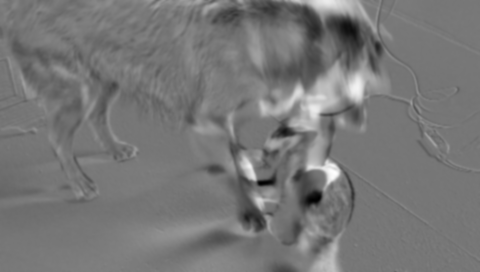

In [99]:
display(np2img(It, norm=True))

The temporal derivative image `It = (I2 - I1)` is normalised to the range of [0,1] to highlight the high-motion pixels. The high-motion pixels are displayed in either very dark or very bright tones on the temporal derivative image.

### Computing the Velocity Vector

In order to compute the velocity vector $(u_{i},v_{i})$, we need to perform the following matrix operations

$
\left[\begin{matrix} u_{i} \\ v_{i} \end{matrix}\right] = \left[\begin{matrix} \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \\ \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \end{matrix}\right]^{-1} \left[\begin{matrix} -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \\ -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \end{matrix}\right],
$

which requires computing the inverse of the $2 \times 2$ structure matrix. The inverse exists if and only if the determinant of the structure matrix is not equal to zero. Suppose that the inverse exits. Then we can compute the velocity vector $(u_{i},v_{i})$ as follows

$
u_{i} = \frac{-\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) +
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j})}
{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j})}
$

and

$
v_{i} = \frac{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j})}
{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j})}.
$

We can implement these operations as follows.

In [100]:
def compute_flow(I1_RGB, I2_RGB, sigma=1.0, w=15, epsilon=1e-8):
    """
    Computes and returns optical flow vector.
    """
    F = np.array([[[0.299, 0.587, 0.114]]])
    I1 = imfilter(I1_RGB, F) / 255.0
    I2 = imfilter(I2_RGB, F) / 255.0
    # Set the kernels
    G = gaussian_kernel(sigma=sigma, dim=2)
    Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
    Sy = Sx.copy().T
    # Blur the current and previous images using a Gaussian kernel
    I1 = imfilter(I1, G)
    I2 = imfilter(I2, G)
    # Calculate the spatial derivatives of the current image
    Ix = imfilter(I2, Sx)
    Iy = imfilter(I2, Sy)
    # Calculate the temporal derivative of the current image
    It = (I2-I1)
    
    B = box_filter(w, w)
    IxIx = imfilter(Ix*Ix, B)
    IxIy = imfilter(Ix*Iy, B)
    IyIy = imfilter(Iy*Iy, B)
    IxIt = imfilter(Ix*It, B)
    IyIt = imfilter(Iy*It, B)

    d = IxIx * IyIy - IxIy * IxIy
    u = np.zeros_like(d)
    v = np.zeros_like(d)
    index = (d>=epsilon)
    u[index] = (- IyIy[index] * IxIt[index] + IxIy[index] * IyIt[index]) / d[index]
    v[index] = (IxIt[index] * IxIy[index] - IxIx[index] * IyIt[index]) / d[index]
    
    return u, v

In [101]:
def draw_flow(im, u, v, delta=1.0, w=7, s=2, fill=(255,0,0), width=1):
    """
    This function draws the velocity field (u,v) on the input image im using
    w x w blocks with field scaling factors s.
    """
    im_flow = im.copy()
    draw = ImageDraw.Draw(im_flow)
    B = box_filter(w,w)
    
    u = imfilter(u, B)
    v = imfilter(v, B)
    
    uv = np.sqrt(u**2 + v**2)
    u[u<=delta] = 0.0
    v[v<=delta] = 0.0
    
    u *= s
    v *= s
    
    uv_max = w // 2
    uv_min = -uv_max
    
    u[u>=uv_max] = uv_max
    u[u<=uv_min] = uv_min
    
    v[v>=uv_max] = uv_max
    v[v<=uv_min] = uv_min
    
    for y in range(w//2, u.shape[0], w):
        for x in range(w//2, u.shape[1], w):
            draw.line((x,y) + (x+u[y,x],y+v[y,x]), fill=fill, width=width)
            
    return im_flow

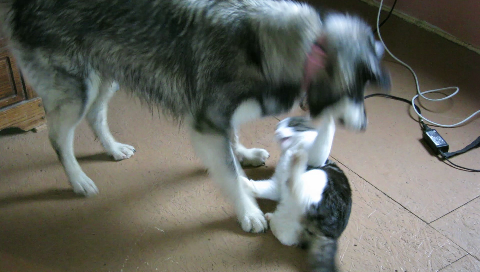

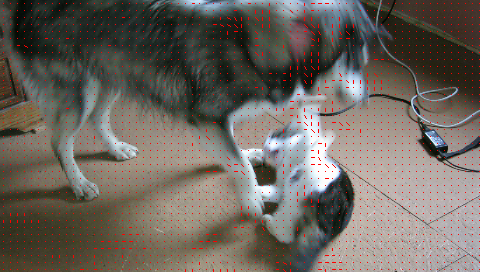

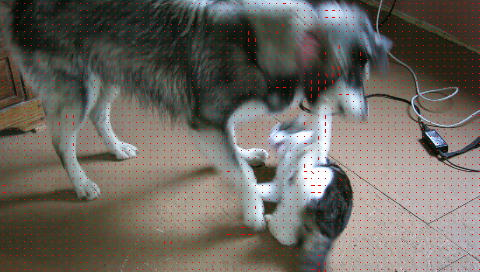

In [102]:
u,v =  compute_flow(I1_RGB, I2_RGB, w=7)
I2_RGB_flow = draw_flow(I2_RGB, u, v)
u,v =  compute_flow(I2_RGB, I3_RGB, w=7)
I3_RGB_flow = draw_flow(I3_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)
display(I3_RGB_flow)

### Your Task [40 Marks]

By changing the parameters `sigma` and `w` of the function `compute_flow(...)`, analyse the impact of change in parameter values on the estimated velocity vector and provide a short report here. Support your discussion with experimental results on another image sequence you can find online or create yourself.

From experimenting with the sigma and w, i have found that changing the sigma value will change the amount of blurring in the image, and changing the w value will change the size of the window used to calculate the optical flow.

If I increase the sigma value, the image will be more blurred, and the optical flow will be less accurate. If I decrease the sigma value, the image will be less blurred, and the optical flow will be more accurate. This is because the optical flow is calculated using the spatial and temporal derivatives of the image, and if the image is blurred, the derivatives will be less accurate. It is important to note that the image should be blurred to some extent, as the optical flow is calculated using the temporal derivative of the image, and if the image is not blurred, the temporal derivative will be very noisy.

If I increase the w value, the window used to calculate the optical flow will be larger, and the optical flow will be less accurate. If I decrease the w value, the window used to calculate the optical flow will be smaller, and the optical flow will be more accurate. This is because the optical flow is calculated using the spatial and temporal derivatives of the image, and if the window is larger, the derivatives will be less accurate. It is important to note that the window should be large enough to capture the motion in the image, but not too large that it captures too much noise. 

### Your Task [40 Marks]

Lucas–Kanade method fails if the motion is large. Find two image sequences for failure and success cases of the Lucas–Kanade method and demonstrate the performance of the Lucas–Kanade method on those image sequences. You can also create your own image sequences. However, you must place those image sequences under the `data` folder.

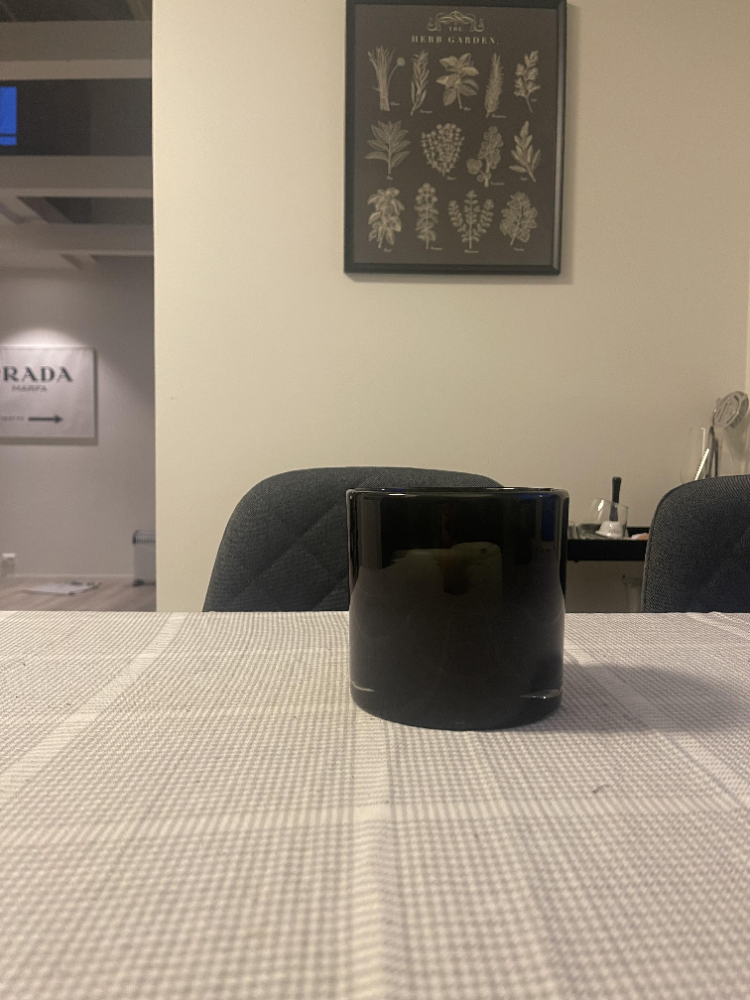

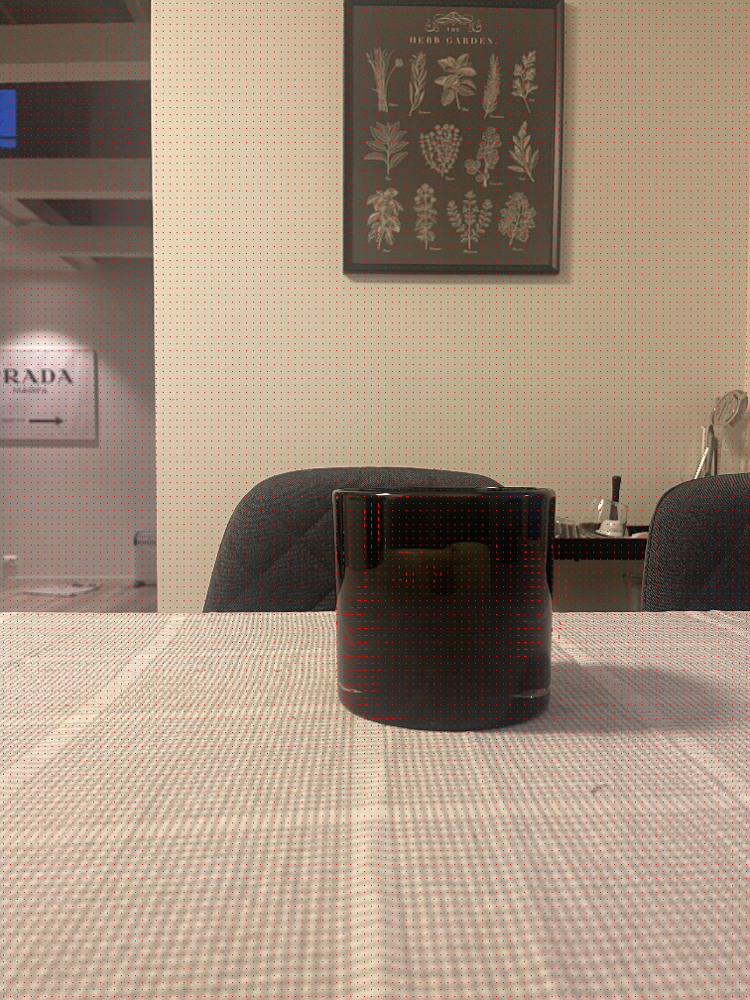

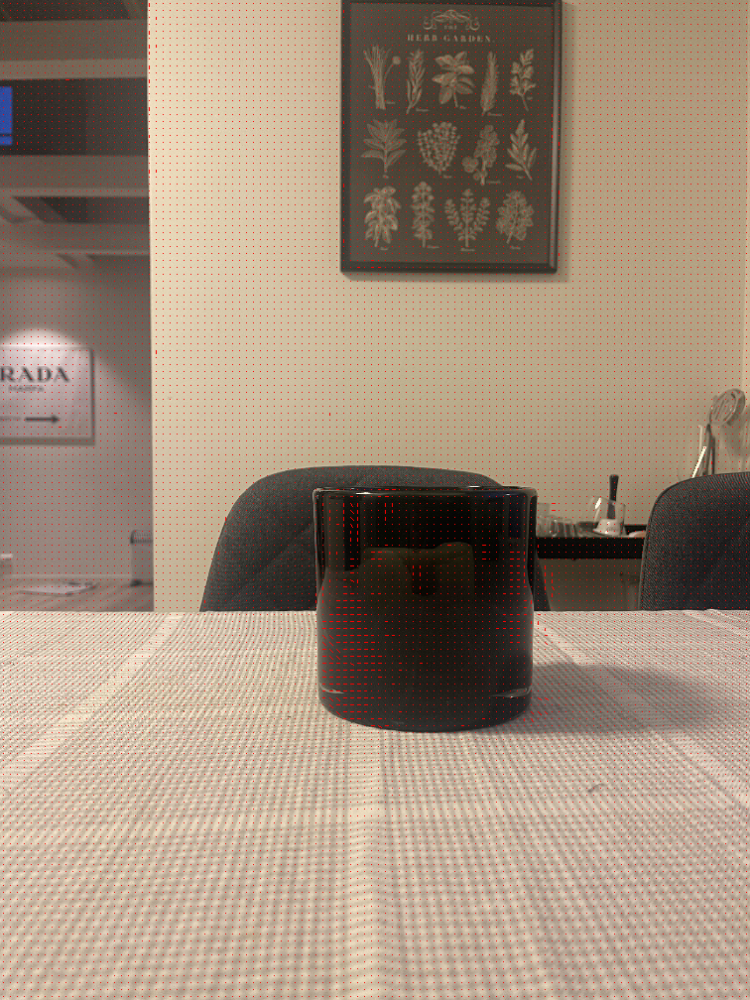

In [103]:
I1_RGB = Image.open('../data/kit1.jpg').convert('RGB')
I2_RGB = Image.open('../data/kit2.jpg').convert('RGB')
I3_RGB = Image.open('../data/kit3.jpg').convert('RGB')
I1_RGB = imresize_nn(I1_RGB, I1_RGB.width//4, I1_RGB.height//4, True)
I2_RGB = imresize_nn(I2_RGB, I2_RGB.width//4, I2_RGB.height//4, True)
I3_RGB = imresize_nn(I3_RGB, I3_RGB.width//4, I3_RGB.height//4, True)


F = np.array([[[0.299, 0.587, 0.114]]])
I1 = imfilter(I1_RGB, F) / 255.0
I2 = imfilter(I2_RGB, F) / 255.0


# Set the kernels
G = gaussian_kernel(sigma=1.0, dim=2)
Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
Sy = Sx.copy().T
# Blur the current and previous images using a Gaussian kernel
I1 = imfilter(I1, G)
I2 = imfilter(I2, G)
# Calculate the spatial derivatives of the current image
Ix = imfilter(I2, Sx)
Iy = imfilter(I2, Sy)
# Calculate the temporal derivative of the current image
It = (I2-I1)


u,v =  compute_flow(I1_RGB, I2_RGB, w=7)
I2_RGB_flow = draw_flow(I2_RGB, u, v)
u,v =  compute_flow(I2_RGB, I3_RGB, w=7)
I3_RGB_flow = draw_flow(I3_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)
display(I3_RGB_flow)

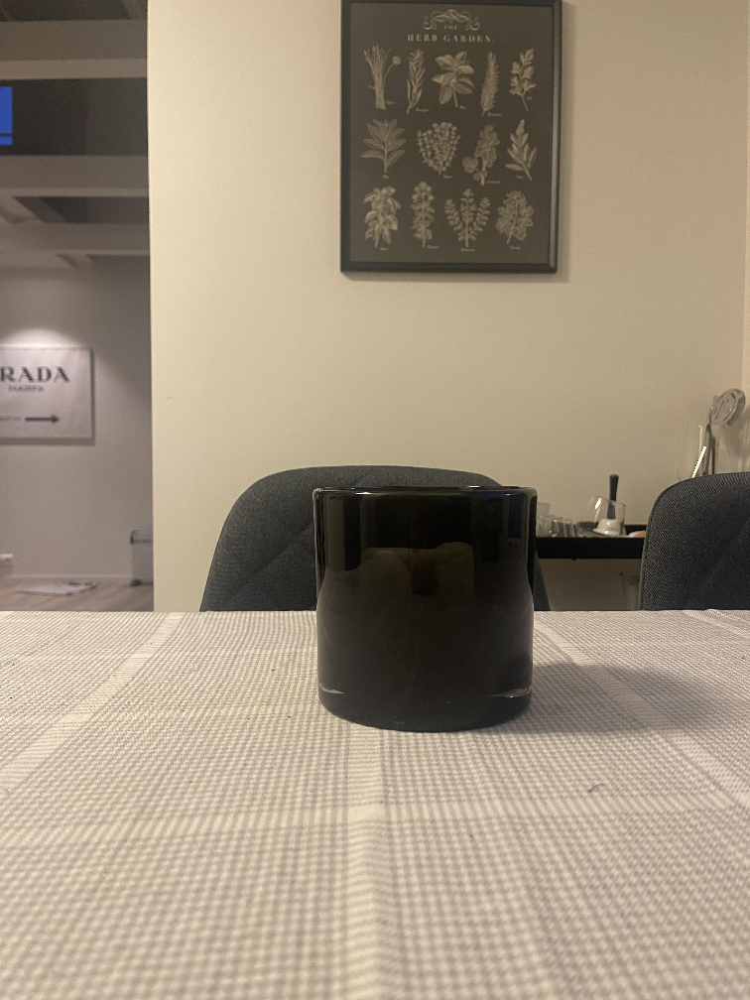

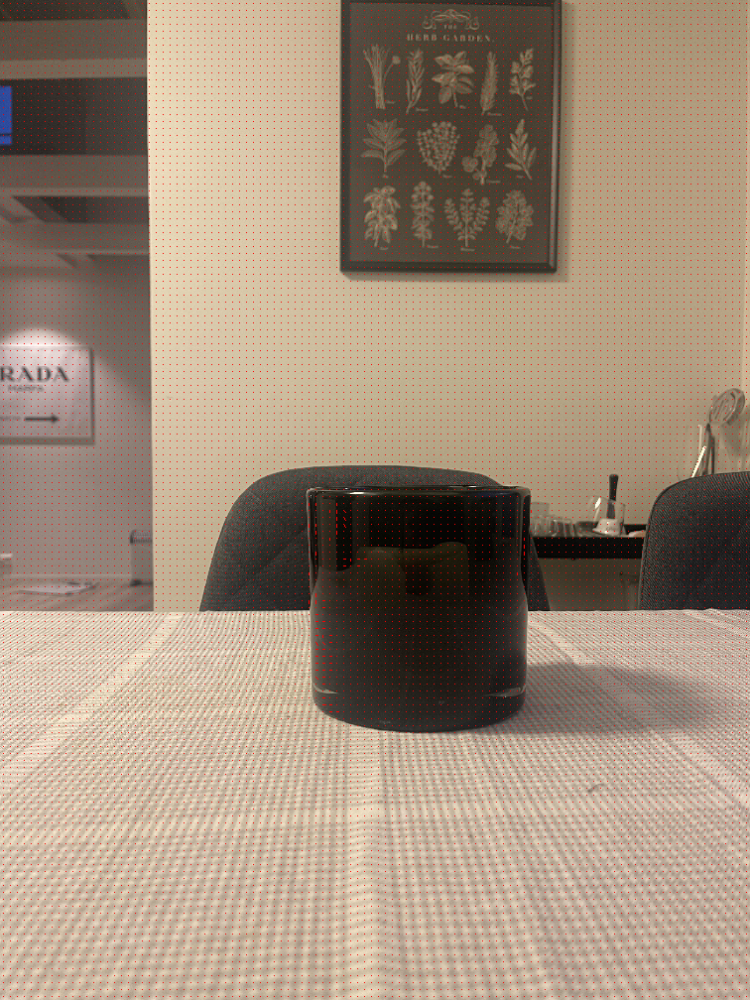

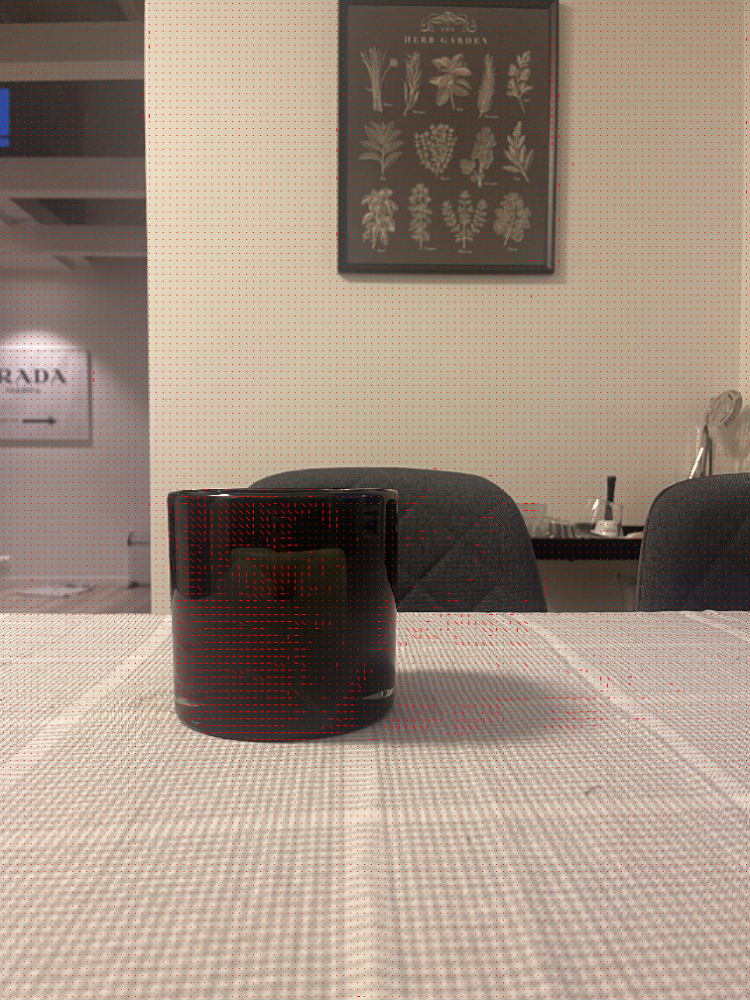

In [104]:
I1_RGB = Image.open('../data/kit3.jpg').convert('RGB')
I2_RGB = Image.open('../data/kit4.jpg').convert('RGB')
I3_RGB = Image.open('../data/kit5.jpg').convert('RGB')
I1_RGB = imresize_nn(I1_RGB, I1_RGB.width//4, I1_RGB.height//4, True)
I2_RGB = imresize_nn(I2_RGB, I2_RGB.width//4, I2_RGB.height//4, True)
I3_RGB = imresize_nn(I3_RGB, I3_RGB.width//4, I3_RGB.height//4, True)


F = np.array([[[0.299, 0.587, 0.114]]])
I1 = imfilter(I1_RGB, F) / 255.0
I2 = imfilter(I2_RGB, F) / 255.0


# Set the kernels
G = gaussian_kernel(sigma=1.0, dim=2)
Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
Sy = Sx.copy().T
# Blur the current and previous images using a Gaussian kernel
I1 = imfilter(I1, G)
I2 = imfilter(I2, G)
# Calculate the spatial derivatives of the current image
Ix = imfilter(I2, Sx)
Iy = imfilter(I2, Sy)
# Calculate the temporal derivative of the current image
It = (I2-I1)


u,v =  compute_flow(I1_RGB, I2_RGB, w=7)
I2_RGB_flow = draw_flow(I2_RGB, u, v)
u,v =  compute_flow(I2_RGB, I3_RGB, w=7)
I3_RGB_flow = draw_flow(I3_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)
display(I3_RGB_flow)

### Your Task [20 Marks]

The Lucas-Kanade method fails if the motion is large. How can you improve the Lucas-Kanade method to handle large motions? Justify your answer with experiments and evidence from the literature.

I have searched online and read through websites and papers, and I have found that the most popular way to improve the Lucas-Kanade to handle large motions is by using a pyramidal approach. From my understanding, the pyramidal approach involves creating a pyramid of images, where each level of the pyramid is a downsampled version of the previous level. The optical flow is calculated at the lowest level of the pyramid, and then the optical flow is refined at each level of the pyramid. This approach allows the Lucas-Kanade method to handle large motions, as the optical flow is calculated at a lower resolution, and then refined at higher resolutions. 

I am putting this paper in the docs folder as a source. We have access to it through the university library:


  Sharmin, N., & Brad, R. (2012). Optimal Filter Estimation for Lucas-Kanade Optical Flow. Sensors : a Peer-Refereed Scientific Journal on the Science and Technology of Physical/chemical Sensors and Biosensors, 12(9), 12694–12709. https://doi.org/10.3390/s120912694
